## EDA ##
---

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys, os
sys.path.insert(0, os.path.abspath('..')) 
import Project_Functions as pf
import pandas_profiling

data = pf.load_data()
Clean_Data = pf.load_and_process()
pf.basics(data)

       Team            Full Name  Overall Rating Position  Age  Speed  \
0      Rams         Aaron Donald              99       RE   29     82   
1  Patriots      Stephon Gilmore              99       CB   29     92   
2  Panthers  Christian McCaffrey              99       HB   24     92   
3    Chiefs      Patrick Mahomes              99       QB   24     81   
4    Saints       Michael Thomas              99       WR   27     89   

   Acceleration  Awareness  Agility  Strength  ...  Jersey Number  \
0            90         99       86        99  ...             99   
1            94         99       94        70  ...             24   
2            93         97       97        72  ...             22   
3            87         97       88        69  ...             15   
4            92         99       92        77  ...             13   

       Total Salary     Signing Bonus          Archetype  \
0   $101,892,000.00    $40,000,000.00     DE_PowerRusher   
1    $33,550,000.00    $31

In [2]:
data.describe(exclude=[np.number])
#Most players in the NFL come from Unviesity of Alabama

,Team,Full Name,Position,Player Handedness,Total Salary,Signing Bonus,Archetype,Running Style,Birthdate,College
count,2293,2293,2293,2293,2293,2293,2293,2293,2293,2293
unique,32,2280,21,2,822,639,46,15,1630,272
top,Eagles,Chris Jones,WR,Right,"$750,000.00",$-,CB_MantoMan,Default Stride Awkward,3/21/1995,Alabama
freq,74,3,280,2243,136,694,152,539,6,70


In [3]:
if len(data[data.duplicated()]) > 0:
    print("No. of duplicated entries: ", len(data[data.duplicated()]))
    print(data[data.duplicated(keep=False)].sort_values(by=list(data.columns)).head())
else:
    print("No duplicated entries found")

No duplicated entries found


In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Overall Rating,2293.0,69.353685,10.291734,23.0,63.0,69.0,75.0,99.0
Age,2293.0,25.744876,3.078649,20.0,24.0,25.0,27.0,43.0
Speed,2293.0,79.833842,10.198032,50.0,72.0,83.0,88.0,99.0
Acceleration,2293.0,85.297863,5.687375,63.0,81.0,87.0,90.0,99.0
Awareness,2293.0,69.884431,11.976678,43.0,60.0,69.0,78.0,99.0
Agility,2293.0,77.398168,10.914979,42.0,69.0,80.0,86.0,98.0
Strength,2293.0,72.404274,11.941032,25.0,64.0,73.0,82.0,99.0
Throw Power,2293.0,30.321413,15.607731,6.0,22.0,26.0,34.0,99.0
Throw On The Run,2293.0,14.686437,17.351282,5.0,6.0,6.0,15.0,97.0
Throw Under Pressure,2293.0,18.084605,14.625869,0.0,11.0,14.0,17.0,98.0


In [4]:
data.describe(include=[np.number])

,Overall Rating,Age,Speed,Acceleration,Awareness,Agility,Strength,Throw Power,Throw On The Run,Throw Under Pressure,...,Kick Power,Change Of Direction,Press,Block Shedding,Run Block Finesse,Injury,Jersey Number,Years Pro,Height,Weight
count,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,...,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000,2293.000000
mean,69.353685,25.744876,79.833842,85.297863,69.884431,77.398168,72.404274,30.321413,14.686437,18.084605,...,22.373310,70.780201,30.159180,45.672918,42.170955,87.755778,50.421718,3.356302,74.108591,245.045792
std,10.291734,3.078649,10.198032,5.687375,11.976678,10.914979,11.941032,15.607731,17.351282,14.625869,...,14.610153,13.743493,24.117341,19.587129,17.754052,3.713639,28.483310,2.926373,2.659892,46.715237
min,23.000000,20.000000,50.000000,63.000000,43.000000,42.000000,25.000000,6.000000,5.000000,0.000000,...,7.000000,33.000000,5.000000,10.000000,10.000000,66.000000,1.000000,0.000000,65.000000,160.000000
25%,63.000000,24.000000,72.000000,81.000000,60.000000,69.000000,64.000000,22.000000,6.000000,11.000000,...,17.000000,58.000000,10.000000,28.000000,33.000000,86.000000,26.000000,1.000000,72.000000,205.000000
50%,69.000000,25.000000,83.000000,87.000000,69.000000,80.000000,73.000000,26.000000,6.000000,14.000000,...,19.000000,73.000000,18.000000,45.000000,45.000000,88.000000,50.000000,3.000000,74.000000,235.000000
75%,75.000000,27.000000,88.000000,90.000000,78.000000,86.000000,82.000000,34.000000,15.000000,17.000000,...,22.000000,83.000000,48.000000,63.000000,50.000000,90.000000,75.000000,5.000000,76.000000,292.000000
max,99.000000,43.000000,99.000000,99.000000,99.000000,98.000000,99.000000,99.000000,97.000000,98.000000,...,99.000000,99.000000,99.000000,97.000000,98.000000,99.000000,99.000000,20.000000,81.000000,380.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10fae1250>,
      dtype=object)

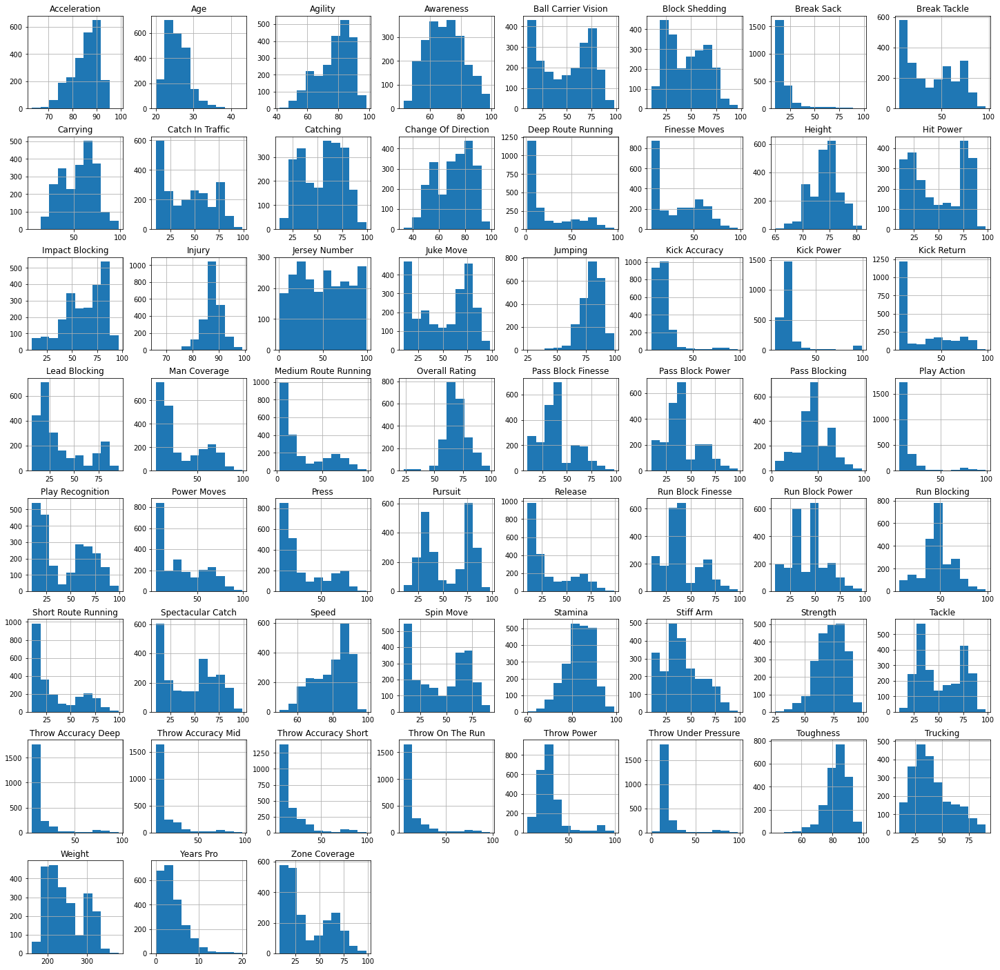

In [4]:
data.hist(bins=10, figsize=(25,25))

## Histogram Observations ##
---

- Some attributes specific like offence, defence, punter, kicker
- Some attibutes position specific like quater back, coner back, defensesive end ect. 
- length of carrer is usually less than 10 years
- players are usually less than 30 years old
- height of players normal distribution

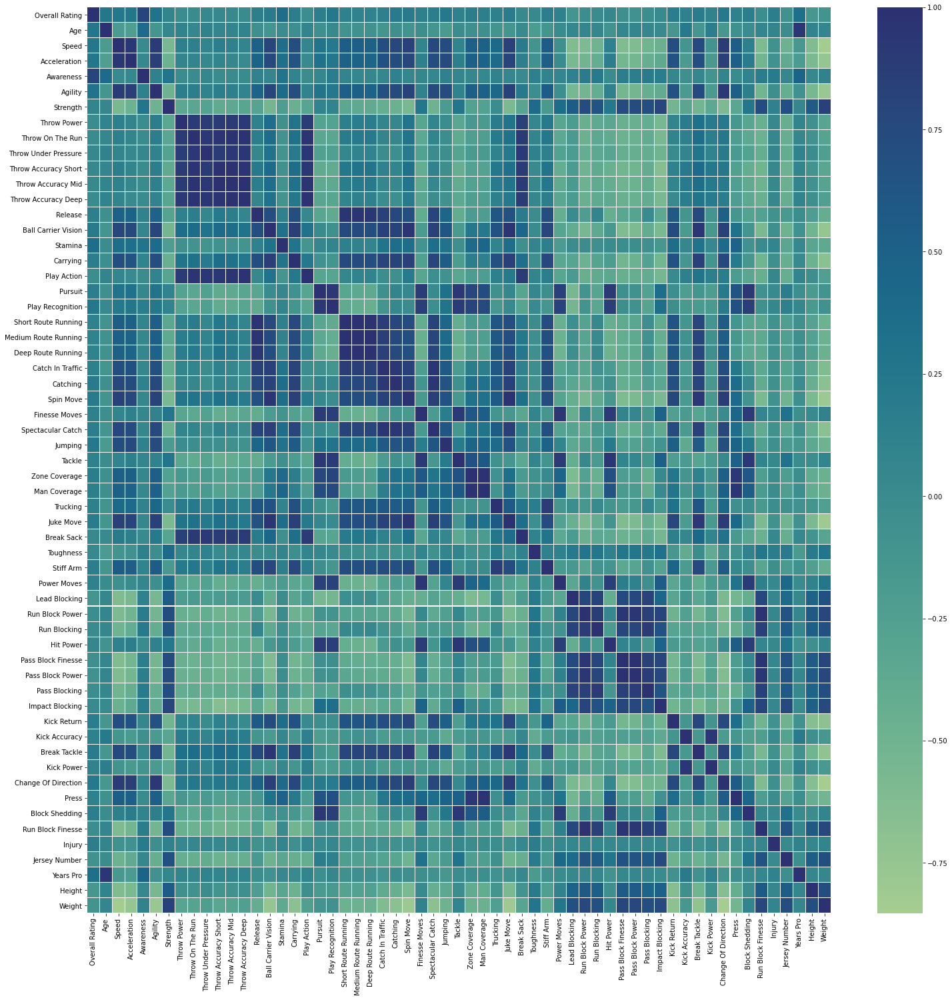

In [3]:
fig, ax = plt.subplots(figsize = (25, 25))
sns.heatmap(data.corr(), cmap = 'crest', linewidths = .01)

## Heatmap Obervations ##
---

- speed and aceleration and agility are positively corelated
- all throw attributes are positively correlated
- injury isnt correlated much with anything
- blocking skills are correlated
- years pro and age are positively correlated

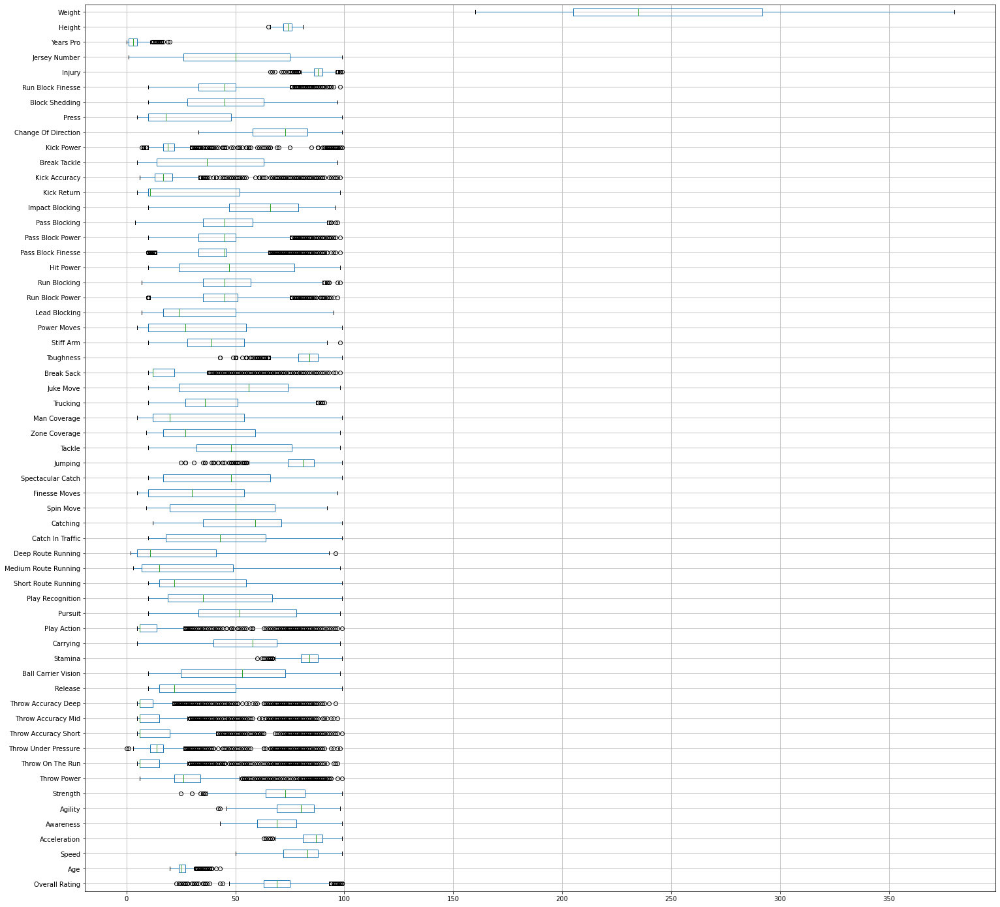

In [10]:
data.boxplot(vert = False, figsize = (25,25))

In [4]:
data_slice = data.iloc[:10, :25]

data_report = data_slice.profile_report()

data_report